In [35]:
%reset
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import netCDF4 as nc
import matplotlib.ticker as mticker
import warnings; warnings.filterwarnings('ignore')
import cmocean
from gsw import alpha, SA_from_SP, p_from_z, CT_from_pt, beta, sigma1 

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [36]:
%cd /net2/smg/documents/OMDT/analysis_CM2p6/grids
os = xr.open_dataset('ocean.static.nc')
fs=xr.open_dataset('ocean_grid.nc')
depth=fs['ht'][:,:]

lon=fs['geolon_t']; lat=fs['geolat_t']
# Coriolis is 2Omega sin(phi) where phi is the latitude of the B-grid velocity point, which should be available in hgrid
Coriolis = 2*7.29e-5*np.sin(fs['geolat_c']/360 *2*np.pi);
#dx = fs['dxt']; dy = fs['dyt']; dxy= (dx**2+dy**2)**0.5
#print(fs,os)

/net2/smg/documents/OMDT/analysis_CM2p6/grids


### For CM2.6 data:

In [37]:
%cd /archive/Richard.Slater/CM2.6/CM2.6_A_Control-1860_V03/history
u = xr.open_dataset('02020101.ocean_minibling_field_u.nc')['u']
v = xr.open_dataset('02020101.ocean_minibling_field_v.nc')['v']
z = u.st_ocean
z_edges  = xr.open_dataset('02020101.ocean_minibling_field_u.nc')['st_edges_ocean']
thickness= z_edges.diff('st_edges_ocean').rename({'st_edges_ocean': 'st_ocean'}).assign_coords({"st_ocean":u.st_ocean})

print(thickness)


/arch2/rds/CM2.6/CM2.6_A_Control-1860_V03/history
<xarray.DataArray 'st_edges_ocean' (st_ocean: 50)>
array([ 10.06709957,  10.09290028,  10.12890053,  10.17849922,
        10.24740219,  10.34269714,  10.47480392,  10.6576004 ,
        10.9101944 ,  11.25960541,  11.74169922,  12.40619659,
        13.32000732,  14.57260132,  16.28289795,  18.604599  ,
        21.73239136,  25.90260315,  31.3868103 ,  38.4697876 ,
        47.40710449,  58.35928345,  71.30871582,  85.9883728 ,
       101.85479736, 118.14520264, 134.01159668, 148.69128418,
       161.64074707, 172.59289551, 181.53027344, 188.61315918,
       194.09741211, 198.26745605, 201.39550781, 203.71704102,
       205.42749023, 206.67993164, 207.59399414, 208.25805664,
       208.74047852, 209.08984375, 209.34228516, 209.52539062,
       209.65722656, 209.75244141, 209.82177734, 209.87109375,
       209.90673828, 209.93310547])
Coordinates:
  * st_ocean  (st_ocean) float64 5.034 15.1 25.22 ... 5.185e+03 5.395e+03


### For CM2.5 data:

In [38]:
# %cd /work/eay/CM2.6/CM2.5data_02020101
# diag_BCKE= xr.open_dataset('02020101.ocean_energy_vort.nc')['kinetic_energy_clinic_intz'][6] #for one month
# diag_BTKE= xr.open_dataset('02020101.ocean_energy_vort.nc')['kinetic_energy_tropic'][6]      #for one month

# u = xr.open_dataset('02020101.ocean_bgc_physics_field_u.nc')['u']
# v = xr.open_dataset('02020101.ocean_bgc_physics_field_v.nc')['v']
# z = u.st_ocean
# z_edges  = xr.open_dataset('02020101.ocean_bgc_physics_field_u.nc')['st_edges_ocean']
# thickness= z_edges.diff('st_edges_ocean').rename({'st_edges_ocean': 'st_ocean'}).assign_coords({"st_ocean":u.st_ocean})

# # print(thickness)

### For CM2-1deg data:

In [39]:
# %cd /work/eay/CM2.6/CM2_1deg_data/ 
# diag_BCKE= xr.open_dataset('02000101.ocean_energy_vort.nc')['kinetic_energy_clinic_intz'][6]
# diag_BTKE= xr.open_dataset('02000101.ocean_energy_vort.nc')['kinetic_energy_tropic'][6]

# u = xr.open_dataset('02000101.ocean_bgc_physics_field_u.nc')['u']
# v = xr.open_dataset('02000101.ocean_bgc_physics_field_v.nc')['v']
# z = u.st_ocean
# z_edges  = xr.open_dataset('02000101.ocean_bgc_physics_field_u.nc')['st_edges_ocean']
# thickness= z_edges.diff('st_edges_ocean').rename({'st_edges_ocean': 'st_ocean'}).assign_coords({"st_ocean":u.st_ocean})

# print(thickness)

In [4]:
KE = 0.5*(u[0,0,:,:]**2+v[0,0,:,:]**2)
thickness.shape

(50,)

In [53]:
%%time
u_ts= u[::2,:,:,:].mean('time')
v_ts= v[::2,:,:,:].mean('time')
print(u_ts.shape,v_ts.shape)
mask = u[-1,:,:,:]*0.0+1.
thickness_test = mask*thickness
print('done 1')
u_BT = (u_ts*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean')
print('done 2')
v_BT = (v_ts*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean')
print('done 3')

print(u_BT.shape,v_BT.shape)


mask = u[0,0,:,:]*0+1
u_BT = mask*u_BT
v_BT = mask*v_BT

In [41]:
%cd /work/eay/CM2.6
u_BT = xr.open_dataset('Barotropic_velocities.nc')['u_BT']
v_BT = xr.open_dataset('Barotropic_velocities.nc')['v_BT']

mask = u[0,0,:,:]

u_BT = u_BT/mask
v_BT = v_BT/mask



/work2/eay/CM2.6


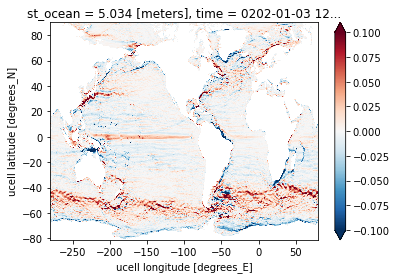

In [43]:
u_BT.plot(vmin=-.1,vmax=.1,cmap='RdBu_r')

In [57]:
print(u_BT[500,500])
test = u[::2,:,500,500].mean('time')
print('done')

<xarray.DataArray ()>
array(0.03446909)
Coordinates:
    xu_ocean  float64 -229.9
    yu_ocean  float64 -59.47
    st_ocean  float64 5.034
    time      object 0202-01-03 12:00:00
done


In [62]:
thickness_test[:,500,500].sum('st_ocean')
depth[500,500]

<xarray.DataArray 'ht' ()>
array(4621.758789)
Coordinates:
    xt_ocean  float64 -229.9
    yt_ocean  float64 -59.49
    geolon_t  float32 ...
    geolat_t  float32 ...
Attributes:
    long_name:      ocean depth on t-cells
    units:          m
    valid_range:    [-1.e+09  1.e+09]
    cell_methods:   time: point
    standard_name:  sea_floor_depth_below_geoid

In [66]:
u_BT[0,0]

<xarray.DataArray ()>
array(nan)
Coordinates:
    xu_ocean  float64 -279.9
    yu_ocean  float64 -81.09
    st_ocean  float64 5.034
    time      object 0202-01-03 12:00:00

In [67]:
%cd /work/eay/CM2.6
ds1 = xr.Dataset({'u_BT': u_BT,'v_BT':v_BT})
print('done')
ds1.to_netcdf('Barotropic_velocities.nc', 'w')




/work2/eay/CM2.6
done


In [7]:
%%time
u_ts= u[::2,:,:,:]
v_ts= v[::2,:,:,:]
print(u_ts.shape,v_ts.shape)
mask = u[-1,:,:,:]*0.0+1.
thickness_test = mask*thickness
print('done 1')
u_BT = (u_ts*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean')
print('done 2')
v_BT = (v_ts*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean')
print('done 3')
u_BC = u_ts-u_BT
v_BC = v_ts-v_BT
print(u_BT.shape,v_BT.shape)

(37, 50, 2700, 3600) (37, 50, 2700, 3600)
done 1
done 2
done 3
(37, 2700, 3600) (37, 2700, 3600)
CPU times: user 2h 12min 48s, sys: 22min 24s, total: 2h 35min 12s
Wall time: 2h 35min 26s


In [8]:
%%time
mask_2D = KE*0.+1.

KE_BT = (0.5*(u_BT**2+v_BT**2)*mask_2D).mean('time')
print('done 1')
KE_BC = (((0.5*(u_BC**2+v_BC**2)*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean'))*mask_2D).mean('time')

done 1
CPU times: user 5min 7s, sys: 13min 14s, total: 18min 21s
Wall time: 18min 36s


In [10]:
Ratio_BTBC_KE = (KE_BT/KE_BC)
print(Ratio_BTBC_KE)

%cd /work/eay/CM2.6
ds1 = xr.Dataset({'Ratio_BTBC_KE': Ratio_BTBC_KE})
print('done')
ds1.to_netcdf('CM2.6_Ratio_BTBC_KE_mean.nc', 'w')
# ds2 = xr.Dataset({'depth': depth})
# print('done')
# ds2.to_netcdf('CM2.6_depth.nc', 'w')

<xarray.DataArray (yu_ocean: 2700, xu_ocean: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * xu_ocean  (xu_ocean) float64 -279.9 -279.8 -279.7 -279.6 ... 79.8 79.9 80.0
  * yu_ocean  (yu_ocean) float64 -81.09 -81.05 -81.0 -80.96 ... 89.92 89.96 90.0
    st_ocean  float64 5.034
/work2/eay/CM2.6
done


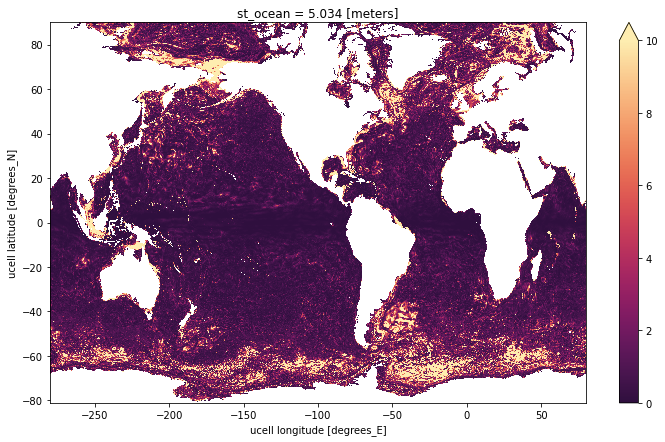

In [12]:
Ratio_BTBC_KE.plot(figsize=(12, 7),cmap=cmocean.cm.matter_r,vmin=0,vmax=10)

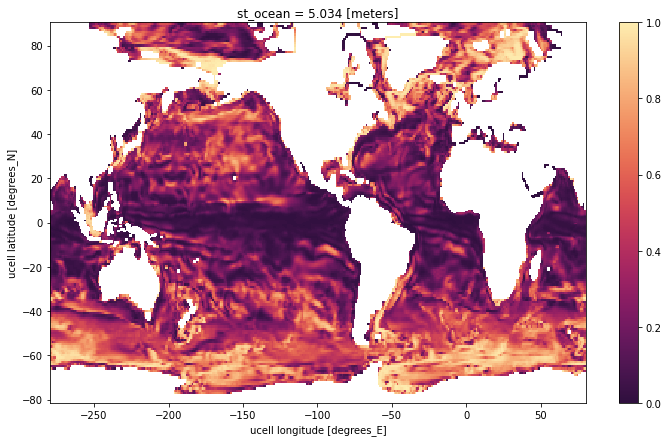

In [15]:
fraction_BT = (KE_BT/(KE_BC+KE_BT))#.mean('time')
fraction_BC = (KE_BC/(KE_BC+KE_BT))#.mean('time')

#fraction_BT_diag = (diag_BTKE/(diag_BCKE+diag_BTKE))
fraction_BT = np.round(fraction_BT, 2)
fraction_BT.plot(figsize=(12, 7),cmap=cmocean.cm.matter_r,vmin=0,vmax=1)


Text(0.5, 1.0, 'Barotropic KE Fraction, $1^\\circ$ CM2-1deg')

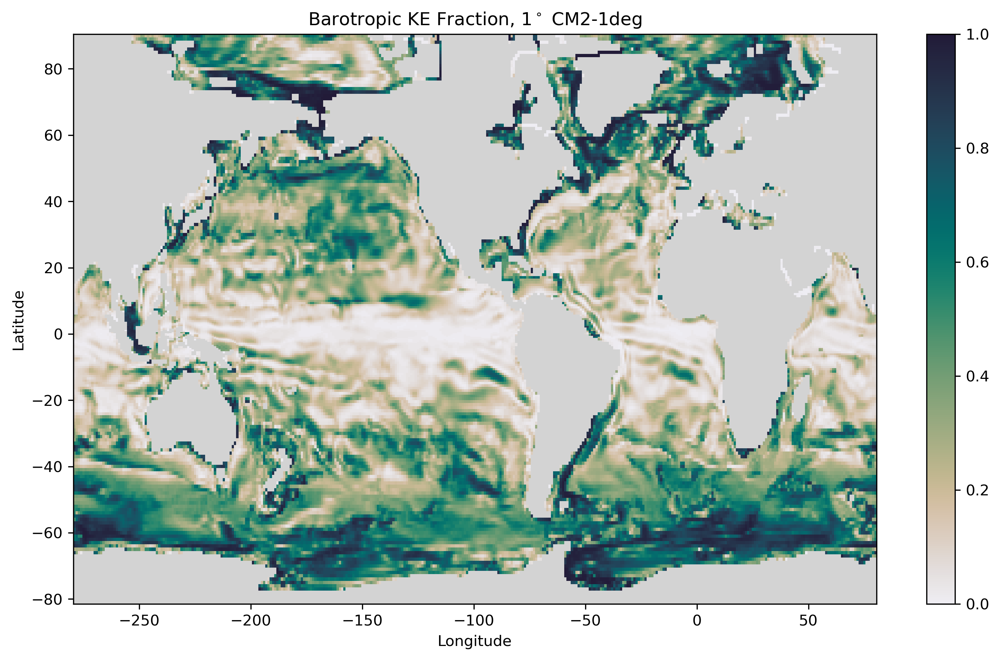

In [16]:
fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')


plot1=fraction_BT.plot(vmin=0,vmax=1,cmap=cmocean.cm.rain)#,extend='min')

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='#D3D3D3')
#current_cmap.set_under('yellow')


plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Barotropic KE Fraction, $1^\circ$ CM2-1deg')

In [17]:
np.nanmean(fraction_BT)

0.3334971977234219

In [59]:
zonal_BT = fraction_BT.mean('xu_ocean')
zonal_BC = fraction_BC.mean('xu_ocean')


done


Text(0.5, 1.0, 'Zonal KE Fraction, $1^\\circ$ CM2-1deg')

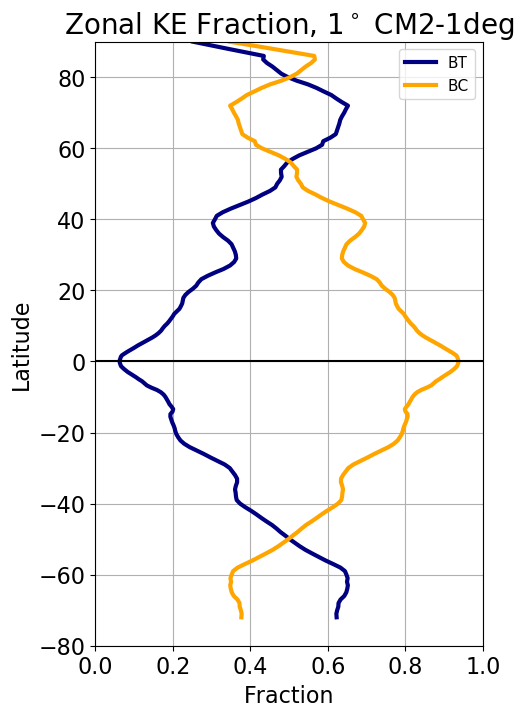

In [62]:
#For the convolution window use N=240 for 1/32 deg.; N=120 for 1/16deg.; N=60 for 1/8deg.; and N=30 for 1/4deg.
window=10

plt.figure(figsize=(5, 8), dpi= 100, facecolor='w', edgecolor='k')
plt.plot(np.convolve(zonal_BT.compute(), np.ones((window,))/window, mode='same'),zonal_BT['yu_ocean'],'-',c=[0,0,0.5],linewidth=3)
print('done')
plt.plot(np.convolve(zonal_BC.compute(), np.ones((window,))/window, mode='same'),zonal_BT['yu_ocean'],'-',c='#FFA500',linewidth=3)
plt.grid()

plt.legend(['BT','BC'],loc='upper right',fontsize=11,handlelength=2)
plt.plot([0, 1],[0, 0],'-',color=[0,0,0])
plt.ylim(-80, 90); plt.xticks(fontsize=16);
plt.xlim(0,1); plt.yticks(fontsize=16);
plt.ylabel('Latitude',fontsize=16)
plt.xlabel('Fraction',fontsize=16)
plt.title('Zonal KE Fraction, $1^\circ$ CM2-1deg',fontsize=20)

Text(0.5, 1.0, '$(u_{BT}/u_{BC})^2$, CM2.6')

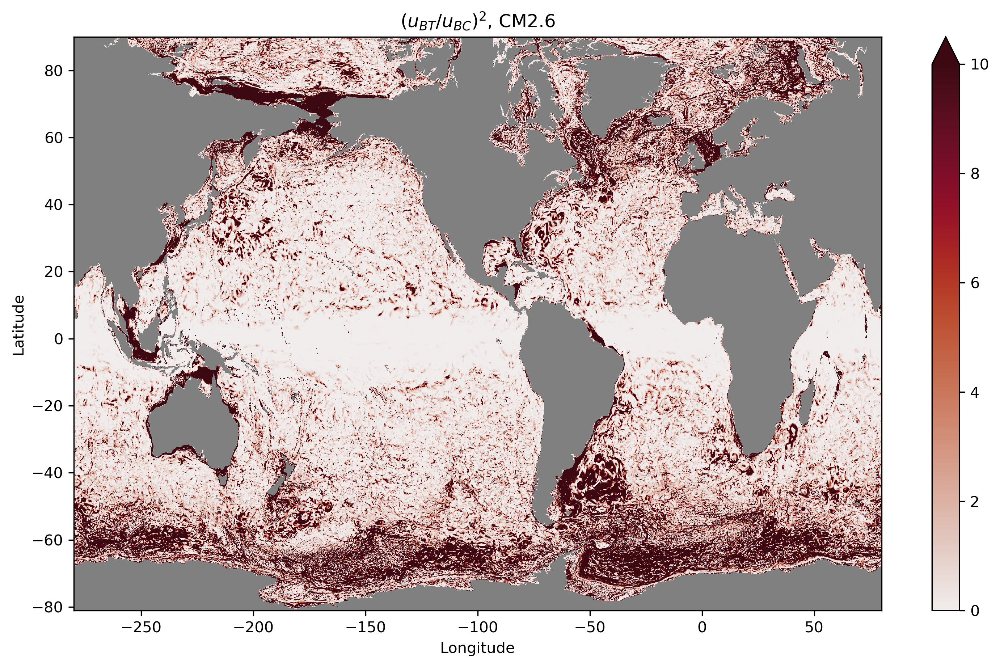

In [8]:
fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')


plot1=((KE_BT/KE_BC)**2).plot(vmin=0,vmax=10,cmap=cmocean.cm.amp)#,extend='min')

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='grey')
#current_cmap.set_under('yellow')


plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('$(u_{BT}/u_{BC})^2$, CM2.6')

In [212]:
zonal_BT = fraction_BT.mean('xu_ocean')
zonal_BC = fraction_BC.mean('xu_ocean')
zonal_BT_025 = zonal_BT

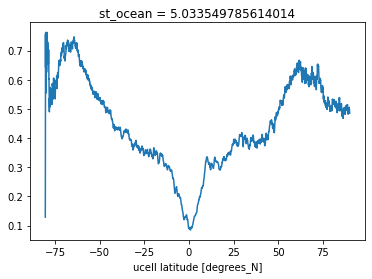

In [213]:
zonal_BT_01.plot()

done


Text(0.5, 1.0, '1/4$^\\circ$ CM2-5 KE Fractions')

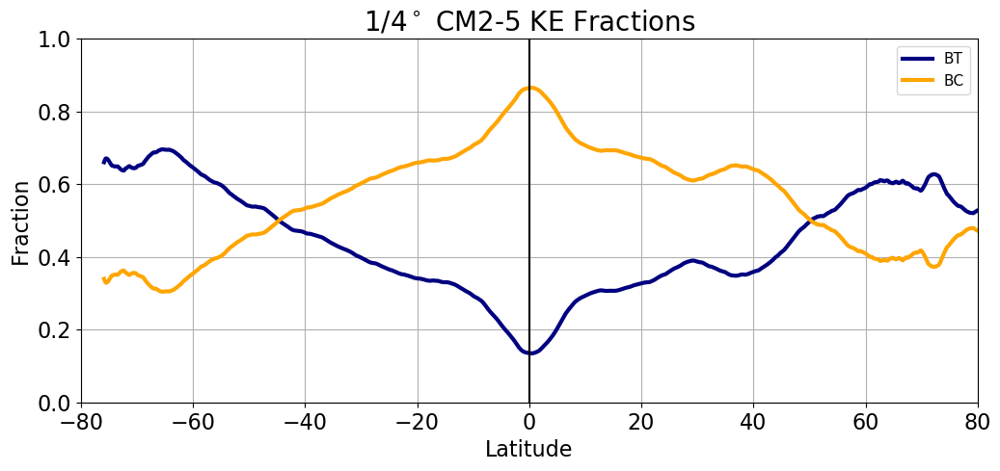

In [215]:
#For the convolution window use N=240 for 1/32 deg.; N=120 for 1/16deg.; N=60 for 1/8deg.; and N=30 for 1/4deg.
window=30

plt.figure(figsize=(12, 5), dpi= 100, facecolor='w', edgecolor='k')
plt.plot(zonal_BT['yu_ocean'],np.convolve(zonal_BT.compute(), np.ones((window,))/window, mode='same'),'-',c=[0,0,0.5],linewidth=3)
print('done')
plt.plot(zonal_BT['yu_ocean'],np.convolve(zonal_BC.compute(), np.ones((window,))/window, mode='same'),'-',c='#FFA500',linewidth=3)
plt.grid()

plt.legend(['BT','BC'],loc='upper right',fontsize=11,handlelength=2)
plt.plot([0, 0],[0, 1],'-',color=[0,0,0])
plt.xlim(-80, 80); plt.xticks(fontsize=16);
plt.ylim(0,1); plt.yticks(fontsize=16);
plt.xlabel('Latitude',fontsize=16)
plt.ylabel('Fraction',fontsize=16)
plt.title('1/4$^\circ$ CM2-5 KE Fractions',fontsize=20)

In [ ]:
#For the convolution window use N=240 for 1/32 deg.; N=120 for 1/16deg.; N=60 for 1/8deg.; and N=30 for 1/4deg.
window=10

plt.figure(figsize=(12, 5), dpi= 100, facecolor='w', edgecolor='k')
plt.plot(zonal_BT_1['yu_ocean'],np.convolve(zonal_BT_1.compute(), np.ones((window,))/window, mode='same'),'-',c='r',linewidth=2)
plt.plot(zonal_BT_025['yu_ocean'],np.convolve(zonal_BT_025.compute(), np.ones((window,))/window, mode='same'),'-',c='y',linewidth=2)
plt.plot(zonal_BT_01['yu_ocean'],np.convolve(zonal_BT_01.compute(), np.ones((window,))/window, mode='same'),'-',c='k',linewidth=2)

plt.grid()

plt.legend(['CM2-1: 1$^\circ$','CM2.5: 1/4$^\circ$','CM2.6: 1/10$^\circ$'],loc='upper right',fontsize=11,handlelength=2)
plt.plot([0, 0],[0, 1],'-',color=[0,0,0])
plt.xlim(-80, 80); plt.xticks(fontsize=16);
plt.ylim(0,1); plt.yticks(fontsize=16);
plt.xlabel('Latitude',fontsize=16)
plt.ylabel('Fraction',fontsize=16)
plt.title('CM2-O BT KE Fraction Comparison',fontsize=20)

### For OM4 data:

In [ ]:
from xgcm import Grid
%cd /work/eay/OM4_rerun2/20030101.nc/
ds= xr.open_dataset('20030101.ocean_5daily.nc')
depth = ds['depth_ocean']
uh = ds['uh'][0:6,:,:,:].rename({'xq': 'xh'}).assign_coords({"xh":depth.xh})
vh = ds['vh'][0:6,:,:,:].rename({'yq': 'yh'}).assign_coords({"yh":depth.yh})


z_edges  = ds['e'][0:6,:,:,:].mean('time')
thickness= z_edges.diff('zi').rename({'zi': 'zl'}).assign_coords({"zl":ds['zl']})
dx = xr.open_dataset('20030101.ocean_static.nc')['dxt']
dy = xr.open_dataset('20030101.ocean_static.nc')['dyt']
u = uh/thickness/dy
v = vh/thickness/dx


u_BT = (u*thickness/thickness.sum('zl')).sum('zl')
v_BT = (v*thickness/thickness.sum('zl')).sum('zl')
print('done 2')
u_BC = u-u_BT
v_BC = v-v_BT

KE_BT = 0.5*(u_BT**2+v_BT**2)
KE_BC = ((0.5*(u_BC**2+v_BC**2)*thickness/thickness.sum('zl')).sum('zl'))

fraction_BT = (KE_BT/(KE_BC+KE_BT)).mean('time')
fraction_BT = np.round(fraction_BT, 2)
fraction_BC = 1-fraction_BT
fraction_BT.plot(figsize=(12, 7),cmap=cmocean.cm.matter_r,vmin=0,vmax=1)

zonal_BT = fraction_BT.mean('xh')
zonal_BC = fraction_BC.mean('xh')

In [ ]:
#For the convolution window use N=240 for 1/32 deg.; N=120 for 1/16deg.; N=60 for 1/8deg.; and N=30 for 1/4deg.
window=30

plt.figure(figsize=(12, 5), dpi= 100, facecolor='w', edgecolor='k')
plt.plot(zonal_BT['yh'],np.convolve(zonal_BT.compute(), np.ones((window,))/window, mode='same'),'-',c=[0,0,0.5],linewidth=3)
print('done')
plt.plot(zonal_BT['yh'],np.convolve(zonal_BC.compute(), np.ones((window,))/window, mode='same'),'-',c='#FFA500',linewidth=3)
plt.grid()

plt.legend(['BT','BC'],loc='upper right',fontsize=11,handlelength=2)
plt.plot([0, 0],[0, 1],'-',color=[0,0,0])
plt.xlim(-80, 80); plt.xticks(fontsize=16);
plt.ylim(0,1); plt.yticks(fontsize=16);
plt.xlabel('Latitude',fontsize=16)
plt.ylabel('Fraction',fontsize=16)
plt.title('1/4$^\circ$ OM4 KE Fractions',fontsize=20)

In [9]:
from pylab import *
from numpy import *
from matplotlib.colors import LinearSegmentedColormap
class nlcmap(LinearSegmentedColormap):
    """A nonlinear colormap"""

    name = 'nlcmap'

    def __init__(self, cmap, levels):
        self.cmap = cmap
        self.monochrome = self.cmap.monochrome
        self.levels = asarray(levels, dtype='float64')
        self._x = self.levels-self.levels.min()
        self._x/= self._x.max()
        self._y = linspace(0, 1, len(self.levels))

    def __call__(self, xi, alpha=1.0, **kw):
        yi = interp(xi, self._x, self._y)
        return self.cmap(yi, alpha)

CPU times: user 8min 30s, sys: 5.03 s, total: 8min 35s
Wall time: 8min 35s


Text(0.5, 1.0, 'BT KE, 1/10$^\\circ$ CM2.6')

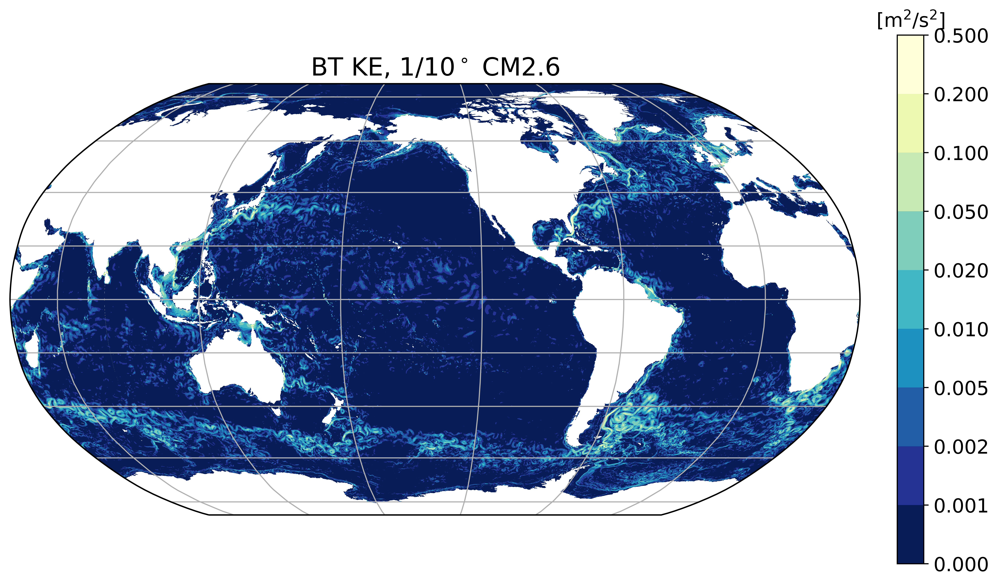

In [62]:
%%time
fig = plt.figure(figsize=(12, 7), dpi= 600, facecolor='w', edgecolor='k')
ax = plt.subplot(projection=ccrs.Robinson(central_longitude=-140))

cmap_lin = plt.get_cmap('YlGnBu_r', 9)
ticklevel=[0.000,0.001,0.002,0.005,0.010,0.020,0.050,0.100,0.200,0.500]
cmap_nonlin = nlcmap(cmap_lin, ticklevel)

#plt.contourf(lon, lat, lon[*0+1.,transform=ccrs.PlateCarree(),cmap='gray',vmin=0,vmax=1.2);

plot1=plt.contourf(lon.values,lat.values,(KE_BT).values,ticklevel,transform=ccrs.PlateCarree(),cmap=cmap_nonlin);
#plot1=plt.pcolormesh(lon.values,lat.values,KE.fillna(0.).values,transform=ccrs.PlateCarree(),cmap=cmocean.cm.deep,vmin=0.0,vmax=0.01);


cbar=plt.colorbar(fraction=0.046, pad=0.04,format='%.3f'); cbar.ax.tick_params(labelsize=14);
cbar.ax.set_title('[m$^2$/s$^2$]', fontsize=14)

gl=ax.gridlines(crs=ccrs.PlateCarree())
plt.title('BT KE, 1/10$^\circ$ CM2.6',fontsize=18) #positive into ocean


CPU times: user 6min 12s, sys: 3.59 s, total: 6min 15s
Wall time: 6min 15s


Text(0.5, 1.0, 'BC KE, 1/10$^\\circ$ CM2.6')

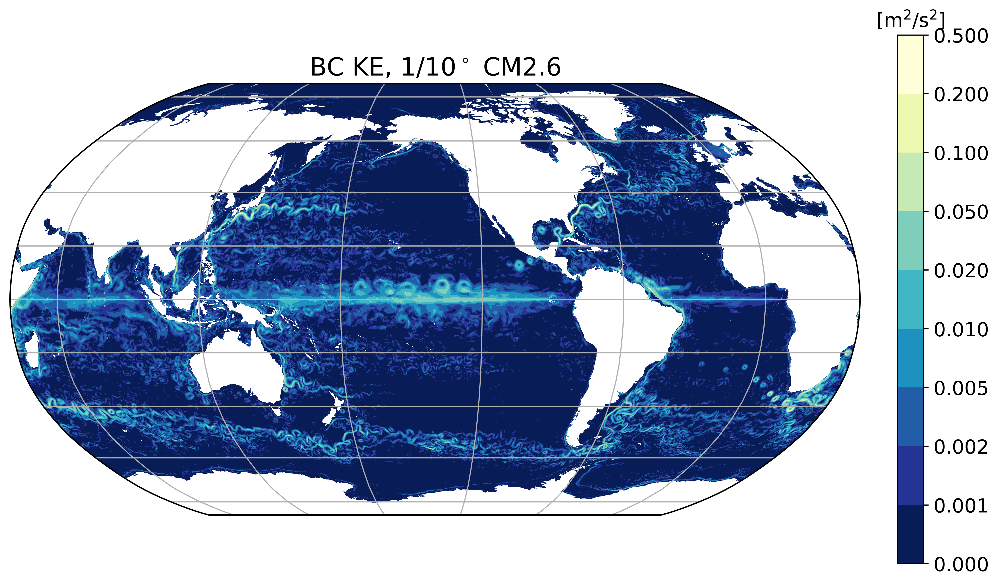

In [63]:
%%time
fig = plt.figure(figsize=(12, 7), dpi= 600, facecolor='w', edgecolor='k')
ax = plt.subplot(projection=ccrs.Robinson(central_longitude=-140))

cmap_lin = plt.get_cmap('YlGnBu_r', 9)
ticklevel=[0.000,0.001,0.002,0.005,0.010,0.020,0.050,0.100,0.200,0.500]
cmap_nonlin = nlcmap(cmap_lin, ticklevel)

#plt.contourf(lon, lat, lon[*0+1.,transform=ccrs.PlateCarree(),cmap='gray',vmin=0,vmax=1.2);

plot1=plt.contourf(lon.values,lat.values,(KE_BC).values,ticklevel,transform=ccrs.PlateCarree(),cmap=cmap_nonlin);
#plot1=plt.pcolormesh(lon.values,lat.values,KE.fillna(0.).values,transform=ccrs.PlateCarree(),cmap=cmocean.cm.deep,vmin=0.0,vmax=0.01);


cbar=plt.colorbar(fraction=0.046, pad=0.04,format='%.3f'); cbar.ax.tick_params(labelsize=14);
cbar.ax.set_title('[m$^2$/s$^2$]', fontsize=14)

gl=ax.gridlines(crs=ccrs.PlateCarree())
plt.title('BC KE, 1/10$^\circ$ CM2.6',fontsize=18) #positive into ocean


CPU times: user 20min 48s, sys: 5.7 s, total: 20min 54s
Wall time: 20min 56s


Text(0.5, 1.0, 'Bathymetry')

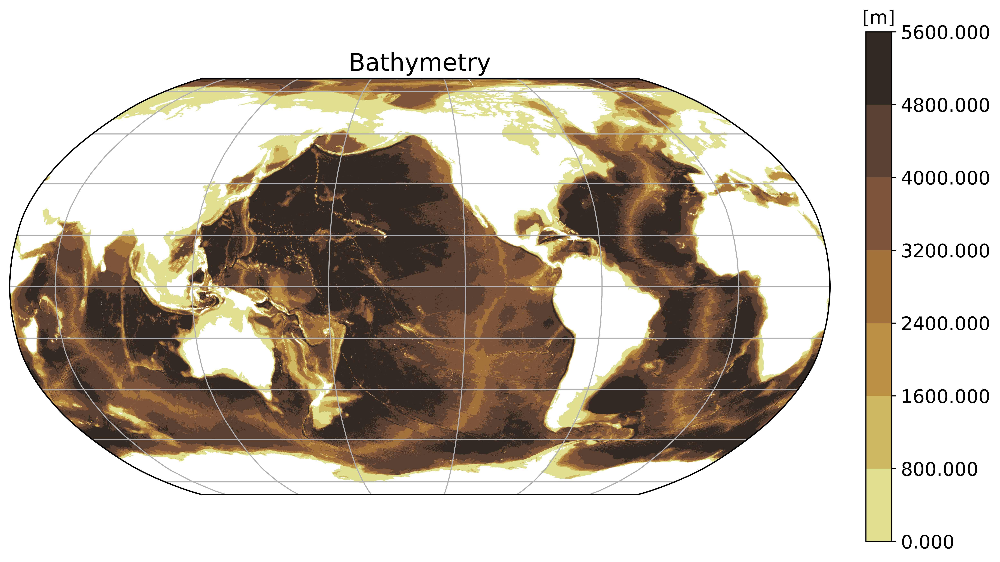

In [65]:
%%time
fig = plt.figure(figsize=(12, 7), dpi= 600, facecolor='w', edgecolor='k')
ax = plt.subplot(projection=ccrs.Robinson(central_longitude=-140))


plot1=plt.contourf(lon.values,lat.values,depth,transform=ccrs.PlateCarree(),cmap=cmocean.cm.turbid);

cbar=plt.colorbar(fraction=0.046, pad=0.04,format='%.3f'); cbar.ax.tick_params(labelsize=14);
cbar.ax.set_title('[m]', fontsize=14)

gl=ax.gridlines(crs=ccrs.PlateCarree())
plt.title('Bathymetry',fontsize=18) #positive into ocean

In [32]:
# %%time
# #fig = plt.figure()
# fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')

# ax = plt.subplot(projection=ccrs.Robinson(central_longitude=-140))

# ticklevel=[0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0];


# plot1=plt.contourf(lon.values,lat.values,fraction_BT.values,ticklevel,transform=ccrs.PlateCarree(),cmap=cmocean.cm.matter_r);


# cbar=plt.colorbar(fraction=0.046, pad=0.04,format='%.3f'); cbar.ax.tick_params(labelsize=14);
# cbar.ax.set_title('[m$^2$/s$^2$]', fontsize=14)

# gl=ax.gridlines(crs=ccrs.PlateCarree())
# plt.title('BT KE Fraction, 1/10$^\circ$ CM2.6',fontsize=18) #positive into ocean